ЗАДАЧА  
1 ЭТАП «ОБЩЕЕ ПОТРЕБЛЕНИЕ ЗА СУТКИ»  

4
**Задача**  

Разработка модели прогнозирования общего энергопотребления региона на
сутки, в МВт*ч  


**Цель** 

Разработать надежную и точную модель прогнозирования объема
энергопотребления на сутки для Калининградской области с использованием
доступных исторических данных и соответствующих переменных.  


**Описание задачи**

В данной задаче необходимо разработать предиктивную модель, которая
позволит прогнозировать энергопотребление региона на основе имеющихся
данных о потреблении электроэнергии в прошлом и соответствующих факторах,
влияющих на потребление энергии. Модель должна быть способна учесть
сезонные, временные и другие зависимости для более точного прогноза.
Модель должна предсказывать общее потребление региона на 1 сутки.  


**Замечание (!)**  

Если мы делаем прогноз на сегодня, то у нас есть все данные за вчера и более
ранние, но нет данных из будущего. Учесть это при конструировании признаков
для модели.  

**Описаниие данных**

***целевой признак***  
target – Фактическое потребление на указанную дату    

***нецелевые признаки***  

date – дата  
time – время, время представлено в диапазоне 0 – 23, что означает 24
часа в сутках  
temp – фактическая температура на указанную дату  
temp_pred – прогноз температуры на указанную дату  
weather_fact – фактическая погода на указанную дату  
weather_pred – прогноз погоды на указанную дату  
 

In [ ]:
#python -m nltk.downloader all

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import phik
import seaborn as sns

import re
import nltk
import string
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import SnowballStemmer
nltk.download('punkt')
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem import WordNetLemmatizer


from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_transformer
from sklearn.pipeline import Pipeline, make_pipeline

from lightgbm import LGBMRegressor
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor

from catboost import CatBoostRegressor
from sklearn.dummy import DummyRegressor
from sklearn.metrics import make_scorer
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score, mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose

import seaborn as sns
from seaborn import kdeplot
import matplotlib.pyplot as plt

import time
import timeit
from datetime import datetime
from tqdm import tqdm
import os

import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [9]:
RS = 231023 #random state
NSPLIT = 10 #количество разбиений для TimeSeriesSplit

### Описание данных

In [10]:
df_train = pd.read_csv('train_dataset.csv')
df_test = pd.read_csv('test_dataset.csv')

In [11]:
display(df_train.head(), df_train.tail())
display(df_test.head(), df_test.tail())

,date,time,target,temp,temp_pred,weather_pred,weather_fact
0,2019-01-01,0,481.510,2.9,2.0,"пасм, ветер",ветер
1,2019-01-01,1,462.872,2.9,2.0,"пасм, ветер",ветер
2,2019-01-01,2,449.718,2.9,2.0,"пасм, ветер",ветер
3,2019-01-01,3,430.908,4.3,2.0,"пасм, ветер","ветер, пасм"
4,2019-01-01,4,415.163,4.3,2.0,"пасм, ветер","ветер, пасм"


,date,time,target,temp,temp_pred,weather_pred,weather_fact
37219,2023-03-31,19,552.960,7.9,6.0,"пасм, 61%","пасм, дымка"
37220,2023-03-31,20,563.985,7.9,6.0,"пасм, 61%","пасм, дымка"
37221,2023-03-31,21,560.191,6.3,5.0,"пасм, 61%","пасм, дымка"
37222,2023-03-31,22,538.796,6.3,5.0,"пасм, 61%","пасм, дымка"
37223,2023-03-31,23,518.685,6.3,5.0,"пасм, 61%","пасм, дымка"


,date,time,target,temp,temp_pred,weather_pred,weather_fact
0,2023-04-01,0,479.282,5.7,5.0,"пасм, 58%","пасм, морось"
1,2023-04-01,1,445.182,5.7,5.0,"пасм, 58%","пасм, морось"
2,2023-04-01,2,424.225,5.7,5.0,"пасм, 58%","пасм, морось"
3,2023-04-01,3,413.866,5.0,4.0,"пасм, 71% дождь","пасм, дымка"
4,2023-04-01,4,408.146,5.0,4.0,"пасм, 71% дождь","пасм, дымка"


,date,time,target,temp,temp_pred,weather_pred,weather_fact
2923,2023-07-31,19,453.173,17.2,18.0,"пасм, 24% дождь",п/обл
2924,2023-07-31,20,446.287,17.2,18.0,"пасм, 24% дождь",п/обл
2925,2023-07-31,21,444.373,15.8,17.0,"пасм, 24% дождь",п/обл
2926,2023-07-31,22,449.078,15.8,17.0,"пасм, 24% дождь",п/обл
2927,2023-07-31,23,416.078,15.8,17.0,"пасм, 24% дождь",п/обл


In [12]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37224 entries, 0 to 37223
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          37224 non-null  object 
 1   time          37224 non-null  int64  
 2   target        37224 non-null  float64
 3   temp          37224 non-null  float64
 4   temp_pred     37136 non-null  float64
 5   weather_pred  37136 non-null  object 
 6   weather_fact  37223 non-null  object 
dtypes: float64(3), int64(1), object(3)
memory usage: 2.0+ MB


#### Преобразование типов данных

In [13]:
# преобразование типа данных колонки date в подходящий

df_train['date'] = pd.to_datetime(df_train['date'], format='%Y-%m-%d')
print(df_train['date'].dtype)

df_test['date'] = pd.to_datetime(df_test['date'], format='%Y-%m-%d')
print(df_test['date'].dtype)

datetime64[ns]
datetime64[ns]


In [14]:
# Проверка сотрировки
df_train['date'].is_monotonic

True

In [15]:
# проверка пропусков часов у суток 

df_train_pass = df_train.groupby(df_train['date']).count()
df_train_pass[df_train_pass.time < 24]

,time,target,temp,temp_pred,weather_pred,weather_fact
date,,,,,,


In [16]:
df_test_pass = df_test.groupby(df_test['date']).count()
df_test_pass[df_test_pass.time < 24]


,time,target,temp,temp_pred,weather_pred,weather_fact
date,,,,,,


#### Обработка пропусков

In [17]:
# пропуски в даннных
display(df_train.isna().sum(), df_test.isna().sum())

date             0
time             0
target           0
temp             0
temp_pred       88
weather_pred    88
weather_fact     1
dtype: int64

date             0
time             0
target           0
temp             0
temp_pred       24
weather_pred    24
weather_fact     0
dtype: int64

Пропуски есть в данных о погоде, их немного по сравнению с объемом обучающих данных, но удалять не стоит, заполненим соседними значениями, тк погода сильно резко и быстро обычно не меняется.

In [18]:
# Смотрим, какие есть возможные значения, которые могут понадобиться для  заполнения
print (
        f"Количество уникальных значений в weather_pred: {df_train['weather_pred'].nunique()}\n\n"
        f"{df_train['weather_pred'].unique()} \n\n ")

print (
        f"Количество уникальных значений в temp_pred: {df_train['temp_pred'].nunique()}\n\n"
        f"{df_train['temp_pred'].unique()} \n\n "
       )

Количество уникальных значений в weather_pred: 2181

['пасм, ветер' 'пасм, 80% дождь' 'пасм, ветер, 76% дождь' ...
 'обл, 23% дождь' 'обл, 9% дождь' 'обл с пр,  42%'] 

 
Количество уникальных значений в temp_pred: 54

[  2.   3.   5.   6.   4.   1.   0.  -1.  -2.  -3.  -4.  -5.  -6.  -7.
 -10.  -9. -11. -12. -13.  -8.   9.   8.   7.  10.  12.  13.  11.  14.
  15.  16.  17.  19.  18.  22.  21.  24.  23.  20.  26.  25.  28.  27.
  29.  31.  30. -16. -17. -19. -20. -18. -14. -15.  nan  32.  33.] 

 


Пропуски есть в данных о погоде, их немного по сравнению с объемом обучающих данных, но удалять не стоит, заполненим соседними значениями, тк погода сильно резко и быстро обычно не меняется.

In [19]:
# заполненение пропусков в погоде

df_train = df_train.replace(method = 'ffill')
df_test = df_test.replace(method = 'ffill')
display(df_train.isna().sum(), df_test.isna().sum())

date            0
time            0
target          0
temp            0
temp_pred       0
weather_pred    0
weather_fact    0
dtype: int64

date            0
time            0
target          0
temp            0
temp_pred       0
weather_pred    0
weather_fact    0
dtype: int64

#### График исходного ряда

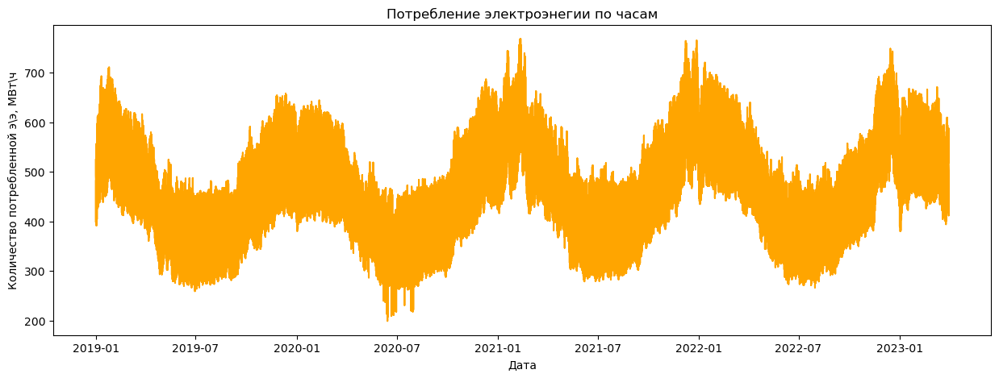

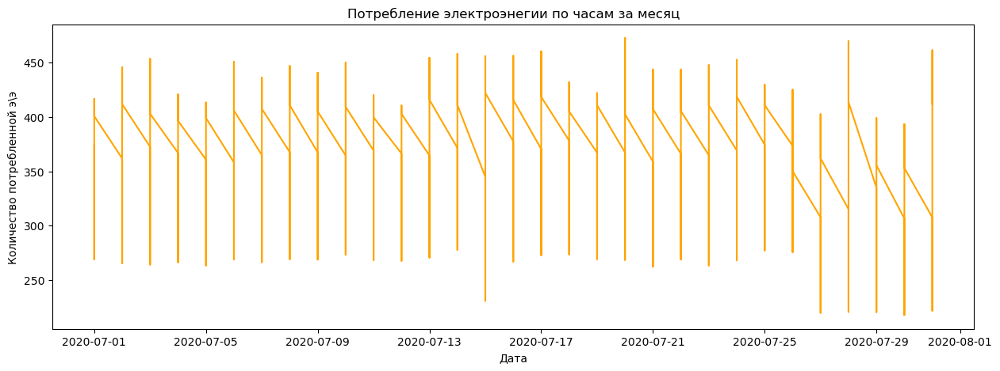

In [13]:
# График исходного ряда
plt.figure(figsize=(15, 5))
plt.plot(df_train['date'], df_train['target'], color = 'orange')
plt.title('Потребление электроэнегии по часам')
plt.xlabel('Дата')
plt.ylabel('Количество потребленной э\э, МВт\ч')
plt.show()

# Срез месяц
start_date = '2020-07-01'
end_date = '2020-07-31'
df_month = df_train[(df_train['date'] >= start_date) & (df_train['date'] <= end_date)]
plt.figure(figsize=(15, 5))
plt.plot(df_month['date'], df_month['target'], color = 'orange')
plt.title('Потребление электроэнегии по часам за месяц')
plt.xlabel('Дата')
plt.ylabel('Количество потребленной э\э')
plt.show()

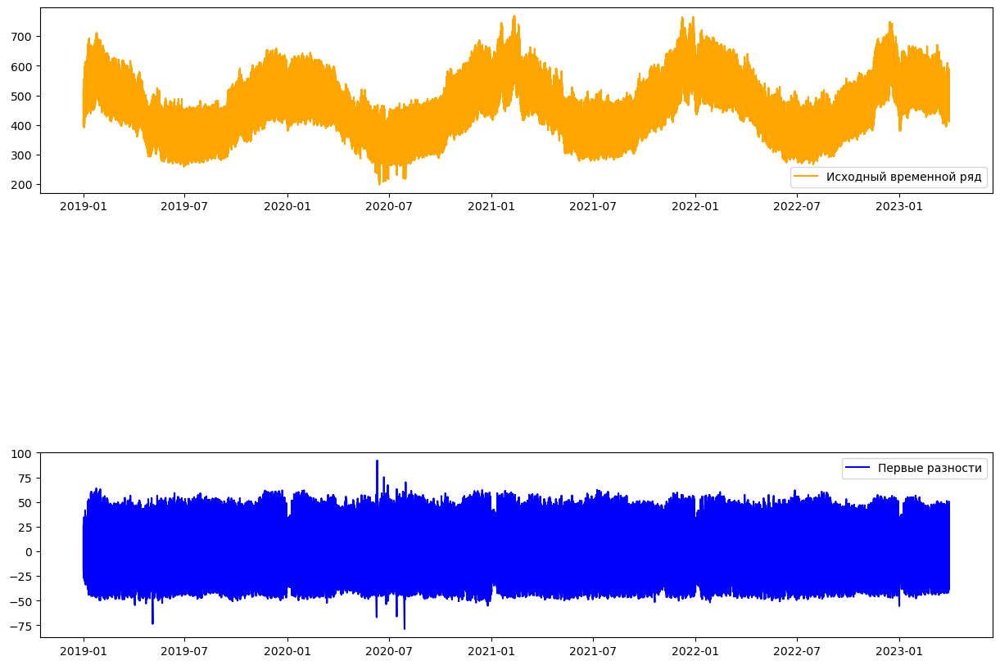

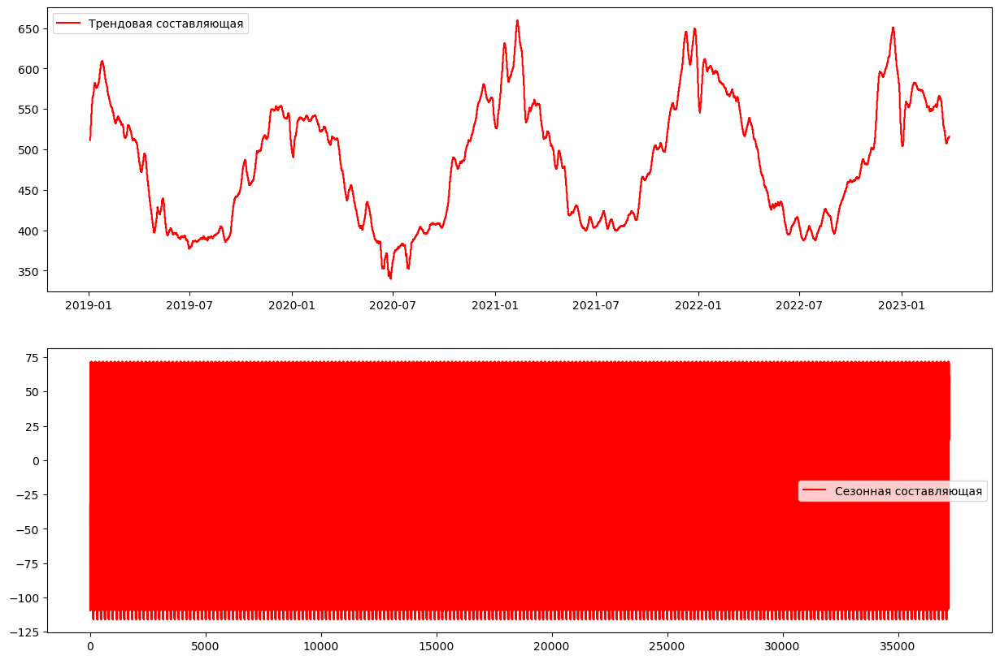

In [14]:
# Cезонные составляющие ряда
result = seasonal_decompose(df_train['target'], model='additive', period=24*7)

# Построим графики:
plt.figure(figsize=(15,10))

# Исходный временной ряд
plt.subplot(311)
plt.plot(df_train['date'], df_train['target'], label='Исходный временной ряд', color='orange')
plt.legend(loc='best')

# Разности
diff = df_train['target'].diff()
plt.subplot(313)
plt.plot(df_train['date'], diff, label='Первые разности', color='blue')
plt.legend(loc='best')
plt.axis('tight')
plt.show()

plt.figure(figsize=(15,10))

# Трендовая составляющая
plt.subplot(211)
plt.plot(df_train['date'], result.trend, label='Трендовая составляющая', color='red')
plt.legend(loc='best')

# Сезонность
plt.subplot(212)
plt.plot(df_train.index, result.seasonal, label='Сезонная составляющая', color='red')
plt.legend(loc='best')

plt.show()

Присутствует сезонность годоовая и внутридневная. 

#### Статистики, выбросы

In [15]:
df_train.describe()

,time,target,temp,temp_pred
count,37224.00000,37224.000000,37224.000000,37224.000000
mean,11.50000,483.731441,8.748995,8.748818
std,6.92228,101.459375,8.125722,8.019339
min,0.00000,198.982000,-21.700000,-20.000000
25%,5.75000,418.950750,2.600000,3.000000
50%,11.50000,473.064000,7.900000,8.000000
75%,17.25000,561.217000,14.700000,15.000000
max,23.00000,767.888000,32.500000,33.000000


In [16]:
df_test.describe()

,time,target,temp,temp_pred
count,2928.000000,2928.000000,2928.000000,2928.000000
mean,11.500000,419.467047,13.768613,13.801230
std,6.923369,71.393070,6.479879,6.473101
min,0.000000,264.819000,-3.100000,-3.000000
25%,5.750000,371.384250,9.200000,9.000000
50%,11.500000,431.477500,14.000000,15.000000
75%,17.250000,462.414250,18.700000,19.000000
max,23.000000,607.474000,31.700000,29.000000


<AxesSubplot:>

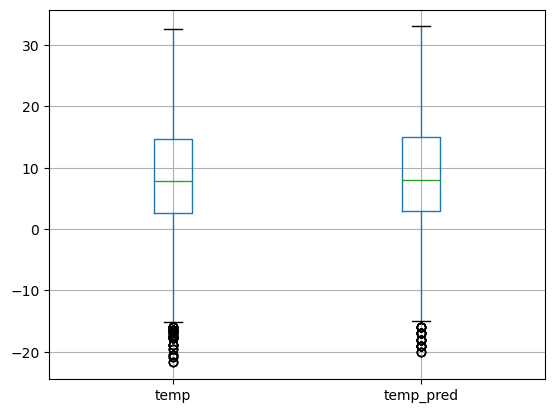

In [17]:
df_train[['temp', 'temp_pred']].boxplot()


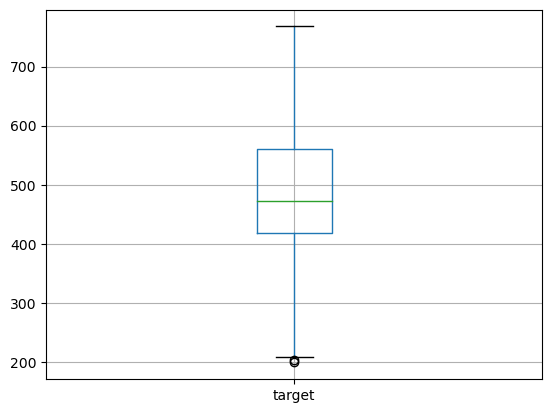

In [18]:
df_train[['target']].boxplot()
plt.show()

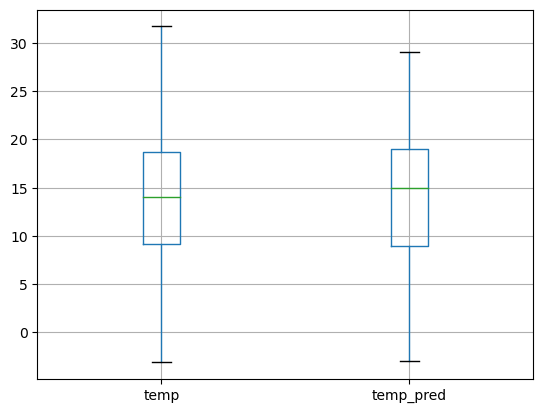

In [19]:
df_test[['temp', 'temp_pred']].boxplot()
plt.show()

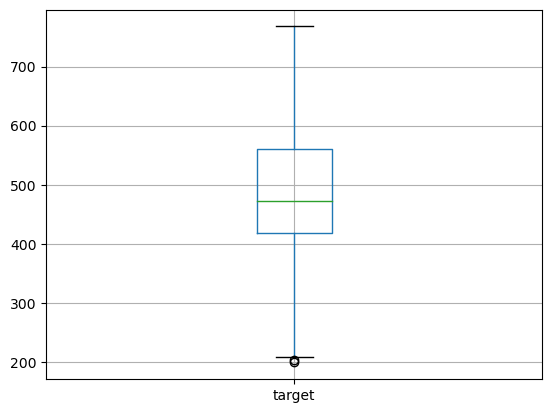

In [20]:
df_train[['target']].boxplot()
plt.show()

Температуры имеют адекватные значения.

#### Корреляция признаков

In [21]:
"""# корреляция признаков
to_del = ['date']
correlation_phik = df_train.drop(to_del, axis=1).phik_matrix().round(2)

# построение матрицы корреляции
mask = np.triu(np.ones_like(correlation_phik, dtype=bool))
plt.figure(figsize=(7, 5))
sns.heatmap(correlation_phik, mask=mask, annot=True, annot_kws={"fontsize": 8})
plt.title('Матрица корреляции')
plt.show()
"""

'# корреляция признаков\nto_del = [\'date\']\ncorrelation_phik = df_train.drop(to_del, axis=1).phik_matrix().round(2)\n\n# построение матрицы корреляции\nmask = np.triu(np.ones_like(correlation_phik, dtype=bool))\nplt.figure(figsize=(7, 5))\nsns.heatmap(correlation_phik, mask=mask, annot=True, annot_kws={"fontsize": 8})\nplt.title(\'Матрица корреляции\')\nplt.show()\n'

Для прогноза можно взаимозаменять weather_fact и weather_pred, temp_fact и temp_pred, чтобы исключить мультиколлинеарные признаки.

### Feature engineering

#### Преобразование признака weather_fact

In [20]:
print (
        f"Количество уникальных значений в weather_fact: {df_train['weather_fact'].nunique()}\n\n"
        f"{df_train['weather_fact'].unique()} \n\n ")

Количество уникальных значений в weather_fact: 580

['ветер' 'ветер, пасм' 'ветер, пасм,дождь' 'ветер, ливень'
 'пасм, ветер, дождь' 'пасм, ветер' 'пасм, ветер, снег, метель'
 'пасм,ветер' 'ясно, ветер' 'пасм, дождь' 'дождь' 'облачно' 'малообл'
 'пасмурно' 'снег, пасм' 'ясно' 'пасм, снег' 'пасм, снег, ветер'
 'пасм,снег' 'снег' 'прояснения' 'пасм, морось, ветер' 'пасм, морось'
 'обл с проясн' 'пасм дождь' 'пасм дождь, ветер' 'пасм,снег, дождь, ветер'
 'облачно, снег, ветер' 'п/обл, ветер, вр снег' 'ветер, снег'
 'п/обл, ветер' 'пасм, ветер, снег' 'п/обл' 'пасмурно, дождь' 'пасм'
 'дымка' 'облачно, снежок)' 'облачно, снег' 'пер.обл.' 'малообл.'
 'обл., снег' 'обл., слабый снег' 'обл., мокрый снег' 'обл., морось'
 'обл., дождик' 'туман' 'ледяной туман' 'облачно, дымка' 'пасм., снежок'
 'пасм, дождь, снег' 'пасм,, мокр снег' 'мокр снег' 'облачно, дождь'
 'пасм, дождь, ветер' 'пасм, снежок' 'пасм, мокр снег' 'обл.,морось'
 'обл., сыро' 'пасм., морось' 'дымка, морось' 'дымка ' 'пасм.,морось

580 разных уникальных значений в признаке weather_fact.   
Однако многие значения имеют одинаковый смылс "пасм, ветер", "пасм,ветер" и "ветер, пасм".  

(Можно было взять weather_pred и сделать новый признак на основе цифр в его значениях (наличие\отсутсвие и величина значения, типо где есть осадки - там будет их вероятность цифрой в признаке отображена, а если цифры нет, то скорее всего и погода хорошая, но это нужно исследовать подробнее признак, может, не везде осадки даны с цифрой - с вероятностью их появления, или что-то другое обозначают и не в % иногда.... Но так как времени почти нет, переделывать не будем.)

In [21]:
stop_words = set(stopwords.words('russian'))
lemmatizer = WordNetLemmatizer()

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [22]:
def tokenized_weather(weather_fact):
    
    weather_fact = str(weather_fact)
    weather_fact = ''.join([char for char in weather_fact if char not in string.punctuation])
    tokens = [word.lower() for word in word_tokenize(weather_fact) if (word not in stopwords.words('russian')) and (len(word)>3)]
    tokens = [token[:3] for token in tokens]
    tokens = [lemmatizer.lemmatize(token) for token in tokens]
  
    return tokens

In [23]:
#  токенизируем train и test
df_train['weather_fact'] = df_train['weather_fact'].apply(tokenized_weather)
df_test['weather_fact'] = df_test['weather_fact'].apply(tokenized_weather)

In [24]:
display(df_train.head(), df_test.head())

,date,time,target,temp,temp_pred,weather_pred,weather_fact
0,2019-01-01,0,481.510,2.9,2.0,"пасм, ветер",[вет]
1,2019-01-01,1,462.872,2.9,2.0,"пасм, ветер",[вет]
2,2019-01-01,2,449.718,2.9,2.0,"пасм, ветер",[вет]
3,2019-01-01,3,430.908,4.3,2.0,"пасм, ветер","[вет, пас]"
4,2019-01-01,4,415.163,4.3,2.0,"пасм, ветер","[вет, пас]"


,date,time,target,temp,temp_pred,weather_pred,weather_fact
0,2023-04-01,0,479.282,5.7,5.0,"пасм, 58%","[пас, мор]"
1,2023-04-01,1,445.182,5.7,5.0,"пасм, 58%","[пас, мор]"
2,2023-04-01,2,424.225,5.7,5.0,"пасм, 58%","[пас, мор]"
3,2023-04-01,3,413.866,5.0,4.0,"пасм, 71% дождь","[пас, дым]"
4,2023-04-01,4,408.146,5.0,4.0,"пасм, 71% дождь","[пас, дым]"


In [ ]:
# токенизируем и векторизируем train

#vectorizer = TfidfVectorizer(tokenizer=tokenized_weather)
#fitted_vectorizer = vectorizer.fit(df_train['weather_fact'])
#tfidf_matrix = fitted_vectorizer.transform(df_train['weather_fact'])
#tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.get_feature_names_out())
#df_train = pd.concat([df_train, tfidf_df], axis=1)
    
#print(df_train.head())

In [ ]:
# токенизируем и векторизируем test

#tfidf_matrix_test = fitted_vectorizer.transform(df_test['weather_fact'])
#tfidf_df_test = pd.DataFrame(tfidf_matrix_test.toarray(), columns=vectorizer.get_feature_names_out())
#df_test = pd.concat([df_test, tfidf_df_test], axis=1)

#print(df_test.head())

In [ ]:
#def colls_mean(df, feature ):
#    return df['date'].map(df.groupby('date')[feature].mean())

#for feature in df_train.columns:
    #print(feature)
#    df_train[feature] = colls_mean(df_train, feature)
#    df_test[feature] = colls_mean(df_test, feature)

#df_train['target'] = df_train['date'].map(df_train.groupby('date')['target'].mean())

In [25]:
train_copy_1 = df_train.copy()
test_copy_1 = df_test.copy()

In [150]:
#df_train = train_copy_1.copy()
#df_test = test_copy_1.copy()

#### Создание признака weather

In [26]:
df_train['weather'] = df_train['weather_fact'].apply(lambda x: 1 if 'ясн' in x or 'сол' in x else 0)
df_test['weather'] = df_test['weather_fact'].apply(lambda x: 1 if 'ясн' in x or 'сол' in x else 0)

In [152]:
display(df_train.head(), df_test.head(2))

,date,time,target,temp,temp_pred,weather_pred,weather_fact,weather
0,2019-01-01,0,481.510,2.9,2.0,"пасм, ветер",[вет],0
1,2019-01-01,1,462.872,2.9,2.0,"пасм, ветер",[вет],0
2,2019-01-01,2,449.718,2.9,2.0,"пасм, ветер",[вет],0
3,2019-01-01,3,430.908,4.3,2.0,"пасм, ветер","[вет, пас]",0
4,2019-01-01,4,415.163,4.3,2.0,"пасм, ветер","[вет, пас]",0


,date,time,target,temp,temp_pred,weather_pred,weather_fact,weather
0,2023-04-01,0,479.282,5.7,5.0,"пасм, 58%","[пас, мор]",0
1,2023-04-01,1,445.182,5.7,5.0,"пасм, 58%","[пас, мор]",0


In [27]:
df_train['weather'].sum()

8487

#### Удаление признаков

удаляем  признаки weather_pred и temp_pred, чтобы избавиться от мультиколлинеарности,
номер часа time, тк будем делать далее ресемплирование по суткам и
weather_fact - так как мы его преобразовали в новый признак.

In [28]:
df_train = df_train.drop(['temp_pred','weather_pred', 'weather_fact', 'time'], axis=1)
df_test = df_test.drop(['temp_pred','weather_pred', 'weather_fact', 'time'], axis=1)
display( df_train.head(), df_train.shape, df_test.head(), df_test.shape)

,date,target,temp,weather
0,2019-01-01,481.510,2.9,0
1,2019-01-01,462.872,2.9,0
2,2019-01-01,449.718,2.9,0
3,2019-01-01,430.908,4.3,0
4,2019-01-01,415.163,4.3,0


(37224, 4)

,date,target,temp,weather
0,2023-04-01,479.282,5.7,0
1,2023-04-01,445.182,5.7,0
2,2023-04-01,424.225,5.7,0
3,2023-04-01,413.866,5.0,0
4,2023-04-01,408.146,5.0,0


(2928, 4)

#### Ресемплирование данных

In [29]:
# по weather можно взять mean - будет отражать степень яности в течение дня в среднем
# пара часов было ясно (значение 0,2 например) или все сутки (значение 1), ночь тоже бывает ясной...
df_train = df_train.groupby('date').agg({'target': 'sum', 'temp': 'mean', 'weather': 'mean'}).reset_index()
df_test = df_test.groupby('date').agg({'target': 'sum', 'temp': 'mean', 'weather': 'mean'}).reset_index()
37224/24, 2928/24
display('train', df_train.shape, df_train.head(), df_train.tail(1), 'test', df_test.shape, df_test.head(), df_test.tail(1))

'train'

(1551, 4)

,date,target,temp,weather
0,2019-01-01,11126.866,4.8750,0.00
1,2019-01-02,11547.210,1.3500,0.00
2,2019-01-03,12235.564,-1.1625,0.75
3,2019-01-04,12763.044,-1.5000,0.00
4,2019-01-05,12735.145,0.9375,0.00


,date,target,temp,weather
1550,2023-03-31,12414.945,8.8125,0.0


'test'

(122, 4)

,date,target,temp,weather
0,2023-04-01,12145.176,4.7375,0.000
1,2023-04-02,12026.069,3.8625,0.625
2,2023-04-03,12633.976,1.2750,0.625
3,2023-04-04,13042.841,0.0375,0.250
4,2023-04-05,13074.646,1.1375,0.000


,date,target,temp,weather
121,2023-07-31,9732.44,17.55,0.0


In [30]:
train_copy = df_train.copy()
test_copy = df_test.copy()

#### Добавление календарных признаков 

In [31]:
# номер месяца
df_train['number_month'] = df_train['date'].dt.month
df_test['number_month'] = df_test['date'].dt.month

In [32]:
# выходные дни 
def get_weekend (date):
    return int(date.weekday() in [5, 6])

df_train['weekend'] = df_train['date'].apply(get_weekend)
df_test['weekend'] = df_test['date'].apply(get_weekend)

In [33]:
# день недели
def get_day_week (date):
    return date.weekday()

df_train['day_week'] = df_train['date'].apply(get_day_week)
df_test['day_week'] = df_test['date'].apply(get_day_week)



In [55]:
#df_train = df_train.drop(['day_week'], axis=1)
#df_test = df_test.drop(['day_week'], axis=1)

In [34]:
display(df_train.shape, df_train.head(), df_test.head(2), df_test.shape)

(1551, 7)

,date,target,temp,weather,number_month,weekend,day_week
0,2019-01-01,11126.866,4.8750,0.00,1,0,1
1,2019-01-02,11547.210,1.3500,0.00,1,0,2
2,2019-01-03,12235.564,-1.1625,0.75,1,0,3
3,2019-01-04,12763.044,-1.5000,0.00,1,0,4
4,2019-01-05,12735.145,0.9375,0.00,1,1,5


,date,target,temp,weather,number_month,weekend,day_week
0,2023-04-01,12145.176,4.7375,0.000,4,1,5
1,2023-04-02,12026.069,3.8625,0.625,4,1,6


(122, 7)

#### Добавление признаков с отстающими значениями

In [35]:
# Сформируем дополнительные признаки: отстающие заданные значения по погоде 
df_train['lag_weather'] = df_train['weather'].shift(1)
df_test['lag_weather'] = df_test['weather'].shift(1)

df_train = df_train.drop(['weather'], axis=1)
df_test = df_test.drop(['weather'], axis=1)

#df_train = df_train.dropna()
#df_test = df_test.dropna()

In [36]:
# Сформируем дополнительные признаки: отстающие заданные значения потребления
for lag in range(1, 8):
        df_train['lag_target{}'.format(lag)] = df_train['target'].shift(lag)
        
for lag in range(1, 8):
        df_test['lag_target{}'.format(lag)] = df_test['target'].shift(lag)  

In [37]:
# Сформируем дополнительные признаки: отстающие заданные значения температуры
for lag in range(1, 8):
        df_train['lag_temp{}'.format(lag)] = df_train['temp'].shift(lag)
        
for lag in range(1, 8):
        df_test['lag_temp{}'.format(lag)] = df_test['temp'].shift(lag)

In [38]:
display(df_train.head())

,date,target,temp,number_month,weekend,day_week,lag_weather,lag_target1,lag_target2,lag_target3,...,lag_target5,lag_target6,lag_target7,lag_temp1,lag_temp2,lag_temp3,lag_temp4,lag_temp5,lag_temp6,lag_temp7
0,2019-01-01,11126.866,4.8750,1,0,1,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2019-01-02,11547.210,1.3500,1,0,2,0.00,11126.866,NaN,NaN,...,NaN,NaN,NaN,4.8750,NaN,NaN,NaN,NaN,NaN,NaN
2,2019-01-03,12235.564,-1.1625,1,0,3,0.00,11547.210,11126.866,NaN,...,NaN,NaN,NaN,1.3500,4.8750,NaN,NaN,NaN,NaN,NaN
3,2019-01-04,12763.044,-1.5000,1,0,4,0.75,12235.564,11547.210,11126.866,...,NaN,NaN,NaN,-1.1625,1.3500,4.875,NaN,NaN,NaN,NaN
4,2019-01-05,12735.145,0.9375,1,1,5,0.00,12763.044,12235.564,11547.210,...,NaN,NaN,NaN,-1.5000,-1.1625,1.350,4.875,NaN,NaN,NaN


In [40]:
# удаление пропусков
#df_train = df_train.dropna()
#df_test = df_test.dropna()

In [39]:
print(df_train.isna().sum().sum(), df_test.isna().sum().sum())

57 57


#### Добавление признаков  среднего

In [40]:
# средняя потребления по месяцам
df_train['target_monthly_avg'] = list(map(dict(df_train.groupby('number_month')['target'].mean()).get, df_train['number_month']))
df_test['target_monthly_avg'] = list(map(dict(df_test.groupby('number_month')['target'].mean()).get, df_test['number_month']))
#df_train = df_train.drop(['number_month'], axis=1)
#df_test = df_test.drop(['number_month'], axis=1)
#df_train = df_train.dropna()
#df_test = df_test.dropna()

In [41]:
# Сформируем дополнительный признак средняя потребления за последние указанные n дней
# cкользящее среднее с заданным окном сглаживания : (задает общий тренд временного ряда)
df_train['roll_mean_target'] = df_train['target'].shift().rolling(window=7).mean()
df_test['roll_mean_target'] = df_test['target'].shift().rolling(window=7).mean()
#df_train = df_train.dropna()
#df_test = df_test.dropna()

In [42]:
# Сформируем дополнительный признак средняя тепмпература за последние указанные n дней
df_train['roll_mean_temp'] = df_train['temp'].shift().rolling(window=7).mean()
df_test['roll_mean_temp'] = df_test['temp'].shift().rolling(window=7).mean()
df_train = df_train.drop(['temp'], axis=1)
df_test = df_test.drop(['temp'], axis=1)


In [43]:
df_train = df_train.dropna()
df_test = df_test.dropna()
print(df_train.isna().sum().sum(), df_test.isna().sum().sum())

0 0


In [ ]:
# для проверки
#df = df_train.copy()
#df['lag_weather'] = df_train['weather'].shift(1)

#df=df_train.copy()
#pd.concat([df_test['target'].shift(), df_test['target']], axis=1)

#### Проверка итоговой таблицы

In [44]:
display(df_train.shape, df_train.head(2), df_test.head(2), df_test.shape)

(1544, 23)

,date,target,number_month,weekend,day_week,lag_weather,lag_target1,lag_target2,lag_target3,lag_target4,...,lag_temp1,lag_temp2,lag_temp3,lag_temp4,lag_temp5,lag_temp6,lag_temp7,target_monthly_avg,roll_mean_target,roll_mean_temp
7,2019-01-08,13185.565,1,0,1,0.0,12719.935,12744.419,12735.145,12763.044,...,-1.425,-3.300,0.9375,-1.5000,-1.1625,1.3500,4.875,13537.179226,12267.454714,-0.032143
8,2019-01-09,13949.530,1,0,2,0.0,13185.565,12719.935,12744.419,12735.145,...,-0.925,-1.425,-3.3000,0.9375,-1.5000,-1.1625,1.350,13537.179226,12561.554571,-0.860714


,date,target,number_month,weekend,day_week,lag_weather,lag_target1,lag_target2,lag_target3,lag_target4,...,lag_temp1,lag_temp2,lag_temp3,lag_temp4,lag_temp5,lag_temp6,lag_temp7,target_monthly_avg,roll_mean_target,roll_mean_temp
7,2023-04-08,11508.091,4,1,5,0.125,12299.460,13111.302,13074.646,13042.841,...,10.6625,2.6625,1.1375,0.0375,1.2750,3.8625,4.7375,11414.135467,12619.067143,3.482143
8,2023-04-09,11159.420,4,1,6,0.875,11508.091,12299.460,13111.302,13074.646,...,9.4250,10.6625,2.6625,1.1375,0.0375,1.2750,3.8625,11414.135467,12528.055000,4.151786


(115, 23)

In [192]:
display(df_train.info(), df_train.describe()) 

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1543 entries, 2019-01-09 to 2023-03-31
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   target              1543 non-null   float64
 1   number_month        1543 non-null   int64  
 2   weekend             1543 non-null   int64  
 3   lag_weather         1543 non-null   float64
 4   lag_target1         1543 non-null   float64
 5   lag_target2         1543 non-null   float64
 6   lag_target3         1543 non-null   float64
 7   lag_target4         1543 non-null   float64
 8   lag_target5         1543 non-null   float64
 9   lag_target6         1543 non-null   float64
 10  lag_target7         1543 non-null   float64
 11  lag_temp1           1543 non-null   float64
 12  lag_temp2           1543 non-null   float64
 13  lag_temp3           1543 non-null   float64
 14  lag_temp4           1543 non-null   float64
 15  lag_temp5           1543 non-null   f

None

,target,number_month,weekend,lag_weather,lag_target1,lag_target2,lag_target3,lag_target4,lag_target5,lag_target6,...,lag_temp1,lag_temp2,lag_temp3,lag_temp4,lag_temp5,lag_temp6,lag_temp7,target_monthly_avg,roll_mean_target,roll_mean_temp
count,1543.000000,1543.000000,1543.000000,1543.000000,1543.000000,1543.000000,1543.000000,1543.000000,1543.000000,1543.000000,...,1543.000000,1543.000000,1543.000000,1543.000000,1543.000000,1543.000000,1543.000000,1543.000000,1543.000000,1543.000000
mean,11605.548556,6.287751,0.285159,0.228208,11606.047986,11606.204143,11606.186866,11606.022779,11606.184444,11606.517527,...,8.788791,8.783047,8.779369,8.780819,8.778915,8.774435,8.770223,11601.051517,11606.220340,8.779371
std,1842.658300,3.505623,0.451636,0.332950,1842.982224,1843.066443,1843.055641,1842.943777,1843.034380,1843.101695,...,7.601622,7.605991,7.610462,7.608753,7.610959,7.614777,7.617086,1685.981302,1804.265537,7.270146
min,7188.661000,1.000000,0.000000,0.000000,7188.661000,7188.661000,7188.661000,7188.661000,7188.661000,7188.661000,...,-16.850000,-16.850000,-16.850000,-16.850000,-16.850000,-16.850000,-16.850000,9393.696048,8163.541143,-12.607143
25%,9877.168000,3.000000,0.000000,0.000000,9877.168000,9877.168000,9877.168000,9877.168000,9877.168000,9877.168000,...,3.037500,3.025000,3.025000,3.025000,3.025000,3.012500,3.006250,10137.820767,9820.044500,3.126786
50%,11575.982000,6.000000,0.000000,0.000000,11575.982000,11575.982000,11575.982000,11575.982000,11575.982000,11575.982000,...,8.137500,8.137500,8.137500,8.137500,8.137500,8.137500,8.137500,11422.985708,11625.446286,7.935714
75%,13117.701500,9.000000,1.000000,0.375000,13119.302000,13119.302000,13119.302000,13119.302000,13119.302000,13119.302000,...,14.968750,14.968750,14.968750,14.968750,14.968750,14.968750,14.968750,13552.830610,13135.104500,15.167857
max,16335.356000,12.000000,1.000000,1.000000,16335.356000,16335.356000,16335.356000,16335.356000,16335.356000,16335.356000,...,26.487500,26.487500,26.487500,26.487500,26.487500,26.487500,26.487500,14084.480210,15823.693143,23.719643


#### Матрицы корреляции

In [ ]:
# матрица корреляции
corr = df_train.corr()
print(corr[abs(corr>0.9)])

In [ ]:
# Тепловая карта матрицы корреляции c признаками, коррелирующими с целевым признаком выше заданного порога
#corr = corr[abs(corr['target']>0.5)]

plt.figure(print(), figsize=(12, 8)), sns.heatmap(corr, annot=True, annot_kws={'size': 7})
plt.title(f'Корреляция признаков')
plt.show()

roll_mean_target очень хорошо коррелирует с target, а также с target_monthly_avg и roll_mean_temp, 
которые тоже хорошо коррелируют с target, возможно, нужно будет удалять признаки.

### Моделирование

#### Подготовка выборок

In [ ]:
#df_train = train_copy.copy()
#df_test = test_copy.copy()

In [45]:
# заменяем индексы колонкой date
df_train.set_index('date', inplace=True)

In [46]:
df_test.set_index('date', inplace=True)

In [47]:
display(df_train.shape, df_train.head(10), df_test.head(2), df_test.shape)

(1544, 22)

,target,number_month,weekend,day_week,lag_weather,lag_target1,lag_target2,lag_target3,lag_target4,lag_target5,...,lag_temp1,lag_temp2,lag_temp3,lag_temp4,lag_temp5,lag_temp6,lag_temp7,target_monthly_avg,roll_mean_target,roll_mean_temp
date,,,,,,,,,,,,,,,,,,,,,
2019-01-08,13185.565,1,0,1,0.0,12719.935,12744.419,12735.145,12763.044,12235.564,...,-1.4250,-3.3000,0.9375,-1.5000,-1.1625,1.3500,4.8750,13537.179226,12267.454714,-0.032143
2019-01-09,13949.530,1,0,2,0.0,13185.565,12719.935,12744.419,12735.145,12763.044,...,-0.9250,-1.4250,-3.3000,0.9375,-1.5000,-1.1625,1.3500,13537.179226,12561.554571,-0.860714
2019-01-10,14339.844,1,0,3,0.0,13949.530,13185.565,12719.935,12744.419,12735.145,...,-2.1250,-0.9250,-1.4250,-3.3000,0.9375,-1.5000,-1.1625,13537.179226,12904.743143,-1.357143
2019-01-11,14606.295,1,0,4,0.0,14339.844,13949.530,13185.565,12719.935,12744.419,...,-6.4750,-2.1250,-0.9250,-1.4250,-3.3000,0.9375,-1.5000,13537.179226,13205.354571,-2.116071
2019-01-12,13522.839,1,1,5,0.0,14606.295,14339.844,13949.530,13185.565,12719.935,...,-3.2000,-6.4750,-2.1250,-0.9250,-1.4250,-3.3000,0.9375,13537.179226,13468.676143,-2.358929
2019-01-13,13138.749,1,1,6,0.0,13522.839,14606.295,14339.844,13949.530,13185.565,...,1.4250,-3.2000,-6.4750,-2.1250,-0.9250,-1.4250,-3.3000,13537.179226,13581.203857,-2.289286
2019-01-14,13922.957,1,0,0,0.0,13138.749,13522.839,14606.295,14339.844,13949.530,...,2.6500,1.4250,-3.2000,-6.4750,-2.1250,-0.9250,-1.4250,13537.179226,13637.536714,-1.439286
2019-01-15,14138.603,1,0,1,0.0,13922.957,13138.749,13522.839,14606.295,14339.844,...,1.2125,2.6500,1.4250,-3.2000,-6.4750,-2.1250,-0.9250,13537.179226,13809.397000,-1.062500
2019-01-16,14048.604,1,0,2,0.0,14138.603,13922.957,13138.749,13522.839,14606.295,...,1.1750,1.2125,2.6500,1.4250,-3.2000,-6.4750,-2.1250,13537.179226,13945.545286,-0.762500


,target,number_month,weekend,day_week,lag_weather,lag_target1,lag_target2,lag_target3,lag_target4,lag_target5,...,lag_temp1,lag_temp2,lag_temp3,lag_temp4,lag_temp5,lag_temp6,lag_temp7,target_monthly_avg,roll_mean_target,roll_mean_temp
date,,,,,,,,,,,,,,,,,,,,,
2023-04-08,11508.091,4,1,5,0.125,12299.460,13111.302,13074.646,13042.841,12633.976,...,10.6625,2.6625,1.1375,0.0375,1.2750,3.8625,4.7375,11414.135467,12619.067143,3.482143
2023-04-09,11159.420,4,1,6,0.875,11508.091,12299.460,13111.302,13074.646,13042.841,...,9.4250,10.6625,2.6625,1.1375,0.0375,1.2750,3.8625,11414.135467,12528.055000,4.151786


(115, 22)

In [48]:
# выделим целевой и остальные признаки
X_train = df_train.drop(['target'], axis=1)
y_train = df_train['target']
X_test = df_test.drop(['target'], axis=1)
y_test = df_test['target']

#### Функции обучения

In [49]:
# cоздаем объект TimeSeriesSplit
cv_iterator = list(TimeSeriesSplit(n_splits=NSPLIT).split(X_train))

In [60]:
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False) #'neg_mean_absolute_error'


def best_model (model, param_dict, features, targets, X_test, y_test):
   
    model_rs = RandomizedSearchCV(estimator=model, \
                                  param_distributions=param_dict, \
                                  cv=cv_iterator, \
                                  n_jobs=4, verbose=1, random_state=RS, \
                                  scoring=mae_scorer) 
    model_rs = model_rs.fit(features, targets)
    best_model = model_rs.best_estimator_
    best_params = model_rs.best_params_
    MAE_train = model_rs.best_score_*-1  
    fit_time = model_rs.refit_time_ # время обучения лучшей модели на всей выборке train
    
    # предсказание на выборке train 
    start_time = time.time()
    predict = best_model.predict(features) # train predict
    end_time = time.time()
    predict_time = end_time - start_time
    
    MAE_train_ = mean_absolute_error(targets, predict)
    MAPE_train = mean_absolute_percentage_error(targets, predict)
    R2_score_train = r2_score(targets, predict)
    
    # оценки на выборке test
    y_pred = best_model.predict(X_test) # test predict
    
    MAE_test = mean_absolute_error(y_test, y_pred)
    MAPE_test = mean_absolute_percentage_error(y_test, y_pred)
    R2_score_test = r2_score(y_test, y_pred)
    
    return {
        'best_model': best_model,
        'best_params': best_params,
        'predict': predict,
        'MAE_train': MAE_train,
        'MAE_train+': MAE_train_,
        'MAPE_train': MAPE_train,
        'R2_score_train': R2_score_train,
        'fit_time': fit_time,
        'predict_time': predict_time,
        'MAE_test': MAE_test,
        'MAPE_test': MAPE_test,
        'R2-score_test': R2_score_test
    }

In [51]:
# cловарь для сохранения результатов обучения моделей
results = {}

In [52]:
# Функция, сопоставляющая прогнозируемые значения с фактическими 
# входящие аргументы : название модели, фактические целевые значения - y,  флаг тестовоя ли быборка
def plot_prediction(name_model, y, sample_test=False):
    
    if sample_test:
        prediction = best_predict
        mae = mae_best_model
    else:
        prediction = results[name_model]['predict']
        mae = results[name_model]['MAE_train']
    
    y_series = pd.Series(y.values, index=y.index)
    prediction_series = pd.Series(prediction, index=y.index)
    plt.figure(figsize=(15, 7))
    plt.plot(prediction_series, "r", label="Предсказания")
    plt.plot(y_series, label="Фактические значения", color='blue')
    plt.legend(loc="best")
    plt.title(f"Предсказания и фактические значения {name_model} MAE: {mae:.2f}")
    plt.grid(True)
    plt.show()
    # график по срезу в последние 14 дней
    plt.figure(figsize=(15, 7))
    plt.plot(prediction_series[-7*24:], "r", label="Предсказания")
    plt.plot(y_series[-7*24:], label="Фактические значения", color='blue')
    plt.legend(loc="best")
    plt.title(f"Предсказания и фактические значения {name_model} ,  MAE: {mae:.2f}")
    plt.grid(True)
    plt.show()

#### Выделение качественных и количественных признаков

In [53]:
 X_train.columns

Index(['number_month', 'weekend', 'day_week', 'lag_weather', 'lag_target1',
       'lag_target2', 'lag_target3', 'lag_target4', 'lag_target5',
       'lag_target6', 'lag_target7', 'lag_temp1', 'lag_temp2', 'lag_temp3',
       'lag_temp4', 'lag_temp5', 'lag_temp6', 'lag_temp7',
       'target_monthly_avg', 'roll_mean_target', 'roll_mean_temp'],
      dtype='object')

In [54]:
#список качественных признаков
category_features = ['day_week', 'number_month']

# список количественных признаков для преобразований
num_features = list(X_train.columns.difference(category_features))

# список дял нормирования температурных признаков от -1 до 1
temp_features= X_train.filter(like='temp')
temp_features = temp_features.columns.tolist()

# список для стандартизации StandartScaler
num_non_temp_features = list(set(num_features) - set(temp_features))

print(category_features, '\n\n', num_features,  '\n\n', temp_features, '\n\n\n', num_non_temp_features)
## tek

['day_week', 'number_month'] 

 ['lag_target1', 'lag_target2', 'lag_target3', 'lag_target4', 'lag_target5', 'lag_target6', 'lag_target7', 'lag_temp1', 'lag_temp2', 'lag_temp3', 'lag_temp4', 'lag_temp5', 'lag_temp6', 'lag_temp7', 'lag_weather', 'roll_mean_target', 'roll_mean_temp', 'target_monthly_avg', 'weekend'] 

 ['lag_temp1', 'lag_temp2', 'lag_temp3', 'lag_temp4', 'lag_temp5', 'lag_temp6', 'lag_temp7', 'roll_mean_temp'] 


 ['weekend', 'lag_target2', 'lag_target6', 'lag_target4', 'roll_mean_target', 'lag_target3', 'lag_target1', 'lag_target5', 'lag_weather', 'target_monthly_avg', 'lag_target7']


#### Кодировщики признаков

In [57]:
preprocessor_linear = make_column_transformer(
    
    (OneHotEncoder(drop='first', handle_unknown='ignore'), category_features),  
    (MinMaxScaler(feature_range=(-1, 1)), temp_features), 
    (StandardScaler(), num_non_temp_features),
    remainder='passthrough', verbose_feature_names_out=False)                                         
##tek

#### Ridge

In [61]:
# Пайплайн для Ridge и ее параметры

model_lr = Ridge(random_state=RS)

pipe_lr = make_pipeline(preprocessor_linear, model_lr)

param_lr = {'ridge__alpha': np.arange(0, 50, 0.01), # [0.1, 1, 10, 100, 1000]   
            'ridge__solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sag'],  # Различные методы оптимизации
            'ridge__max_iter': [None, 100, 500, 1000] 
            }

In [62]:
#%%time

best_model_lr = best_model(pipe_lr, param_lr, X_train, y_train, X_test, y_test)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [63]:
results['Ridge']= best_model_lr
results['Ridge']

{'best_model': Pipeline(steps=[('columntransformer',
                  ColumnTransformer(remainder='passthrough',
                                    transformers=[('onehotencoder',
                                                   OneHotEncoder(drop='first',
                                                                 handle_unknown='ignore'),
                                                   ['day_week', 'number_month']),
                                                  ('minmaxscaler',
                                                   MinMaxScaler(feature_range=(-1,
                                                                               1)),
                                                   ['lag_temp1', 'lag_temp2',
                                                    'lag_temp3', 'lag_temp4',
                                                    'lag_temp5', 'lag_temp6',
                                                    'lag_temp7',
                                 

In [ ]:
plot_prediction('Ridge', y_train)

#### LinearRegression

In [64]:
# Пайплайн для LinearRegression и ее параметры

model_linear = LinearRegression()

pipe_linear = make_pipeline(preprocessor_linear, model_linear)

param_linear = {}

In [65]:
%%time

best_model_linear = best_model(pipe_linear, param_linear, X_train, y_train, X_test, y_test)

Fitting 10 folds for each of 1 candidates, totalling 10 fits
Wall time: 2.46 s


In [66]:
results['LinearRegression']= best_model_linear
results['LinearRegression']

{'best_model': Pipeline(steps=[('columntransformer',
                  ColumnTransformer(remainder='passthrough',
                                    transformers=[('onehotencoder',
                                                   OneHotEncoder(drop='first',
                                                                 handle_unknown='ignore'),
                                                   ['day_week', 'number_month']),
                                                  ('minmaxscaler',
                                                   MinMaxScaler(feature_range=(-1,
                                                                               1)),
                                                   ['lag_temp1', 'lag_temp2',
                                                    'lag_temp3', 'lag_temp4',
                                                    'lag_temp5', 'lag_temp6',
                                                    'lag_temp7',
                                 

In [ ]:
plot_prediction('LinearRegression', y_train)

#### CatBoostRegressor

In [ ]:
%%time
model_cat = CatBoostRegressor()
params_cat = [{'learning_rate':[0.1, 0.5, 0.8],
         'depth': [4, 6, 10],
         'l2_leaf_reg': [1, 3, 5, 7, 9]}]
grid_cat = GridSearchCV(model_cat, params_cat, scoring='neg_mean_absolute_error', cv=5)
grid_cat.fit(X_train, y_train)

0:	learn: 1695.1274376	total: 1.03ms	remaining: 1.03s
1:	learn: 1553.6520757	total: 2.1ms	remaining: 1.05s
2:	learn: 1428.1539683	total: 2.9ms	remaining: 963ms
3:	learn: 1317.0348451	total: 3.84ms	remaining: 957ms
4:	learn: 1215.6624233	total: 4.66ms	remaining: 927ms
5:	learn: 1127.2962570	total: 5.47ms	remaining: 907ms
6:	learn: 1044.3412603	total: 6.22ms	remaining: 882ms
7:	learn: 965.8855121	total: 7ms	remaining: 868ms
8:	learn: 901.8138209	total: 7.95ms	remaining: 876ms
9:	learn: 842.6310375	total: 8.83ms	remaining: 874ms
10:	learn: 788.1165693	total: 9.66ms	remaining: 868ms
11:	learn: 734.4267682	total: 10.5ms	remaining: 867ms
12:	learn: 693.0841482	total: 11.3ms	remaining: 860ms
13:	learn: 653.7044407	total: 12.3ms	remaining: 865ms
14:	learn: 617.9049797	total: 13.2ms	remaining: 864ms
15:	learn: 580.5731692	total: 14.1ms	remaining: 865ms
16:	learn: 550.3907291	total: 15ms	remaining: 865ms
17:	learn: 522.4224179	total: 15.9ms	remaining: 868ms
18:	learn: 502.1961201	total: 16.7ms	r

In [ ]:
pred_test = grid_cat.predict(X_test)
print("MAE тестовой выборки:", mean_absolute_error(y_test, pred_test))

#### Проверка на адекватность

In [ ]:
from sklearn.dummy import DummyRegressor
dummy_model = make_pipeline(preprocessor_linear, DummyRegressor(strategy='mean'))
dummy_model.fit(X_train, y_train)
dummy_model_predict = dummy_model.predict(X_train)
MAE_dummy = mean_absolute_error(y_train, dummy_model_predict)
MAE_dummy

### Анализ моделей на обучающей выборке

In [67]:
# Результирующая таблица лучших моделей по качеству mae
df_results = pd.DataFrame(results).T
df_results

,best_model,best_params,predict,MAE_train,MAE_train+,MAPE_train,R2_score_train,fit_time,predict_time,MAE_test,MAPE_test,R2-score_test
Ridge,"(ColumnTransformer(remainder='passthrough',\n ...","{'ridge__solver': 'lsqr', 'ridge__max_iter': 1...","[12900.49691074879, 13268.814008984858, 13978....",191.199403,161.262277,0.014154,0.984413,0.017012,0.008006,131.870074,0.013174,0.927348
LinearRegression,"(ColumnTransformer(remainder='passthrough',\n ...",{},"[12797.972698744752, 13328.95308822367, 14072....",187.125114,159.839929,0.014041,0.984751,0.029021,0.009007,136.705221,0.013688,0.923094


In [77]:
df_results['best_model']['Ridge']#.predict(X_test)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'),
                                                  ['day_week', 'number_month']),
                                                 ('minmaxscaler',
                                                  MinMaxScaler(feature_range=(-1,
                                                                              1)),
                                                  ['lag_temp1', 'lag_temp2',
                                                   'lag_temp3', 'lag_temp4',
                                                   'lag_temp5', 'lag_temp6',
                                                   'lag_temp7',
                                                   'roll_mean_temp']),
                                                 ('standardscaler',
                                                  StandardScaler(),
                                                  ['weekend', 'lag_target2',
                                                   'lag_target6', 'lag_target4',
                                                   'roll_mean_target',
                                                   'lag_target3', 'lag_target1',
                                                   'lag_target5', 'lag_weather',
                                                   'target_monthly_avg',
                                                   'lag_target7'])],
                                   verbose_feature_names_out=False)),
                ('ridge',
                 Ridge(alpha=2.63, max_iter=100, random_state=231023,
                       solver='lsqr'))])

In [80]:
model = df_results['best_model']['Ridge']

In [81]:
import joblib
joblib.dump(model, 'trained_model.pkl') # это в обучающей части в блокноте сохраняем модель

In [94]:
# main.py модуль начинается примерно так
import joblib
loaded_model = joblib.load('trained_model.pkl')




arr = loaded_model.predict(X_test)
result = pd.DataFrame(index = X_test.index, columns=['predict'])
# тут сохранение в csv и создание датафрейма
result['predict'] = arr
result.to_csv('predict.csv')
result

,predict
date,
2023-04-08,11585.208427
2023-04-09,11181.928445
2023-04-10,11727.427035
2023-04-11,11626.633561
2023-04-12,11248.444751
...,...
2023-07-27,9759.120690
2023-07-28,9679.619090
2023-07-29,9379.331870


### Тестирование  выбранной модели

In [78]:
df_results['best_model']['Ridge'].predict(X_test)

array([11585.20842695, 11181.92844497, 11727.42703543, 11626.63356099,
       11248.44475055, 11208.26303281, 11359.72278155, 10763.67173158,
       10836.38001843, 11436.85170835, 11523.3716673 , 11346.33356134,
       11479.47818791, 10917.29066125, 10362.69481325, 10164.19255095,
       10361.2469371 , 10511.70512332, 10874.8587348 , 11159.64009151,
       11311.6634158 , 10798.56338225, 10407.33754337, 10928.03657543,
       10462.12163119, 10944.27263248, 11122.62324276, 11023.24132634,
       10650.46177328, 10329.64729511, 10755.1509042 , 10294.32176761,
        9705.51953229, 10117.56930952,  9962.39477092,  9356.16424451,
        9061.42448683,  9507.20389132,  9744.9016561 , 10000.34262596,
       10030.94119257, 10039.28327416,  9624.52066914,  9143.40743134,
        9648.29132215,  9542.865213  ,  9379.24381543,  9416.82165729,
        9451.44375725,  9178.95244984,  8947.6466857 ,  9537.94313584,
        9496.50355444,  9529.32255351,  9546.3020943 ,  9497.80316065,
      